In [0]:
!nvidia-smi

Thu Dec 19 22:47:06 2019       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 440.44       Driver Version: 418.67       CUDA Version: 10.1     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|===============================+======================+======================|
|   0  Tesla P100-PCIE...  Off  | 00000000:00:04.0 Off |                    0 |
| N/A   40C    P0    26W / 250W |      0MiB / 16280MiB |      0%      Default |
+-------------------------------+----------------------+----------------------+
                                                                               
+-----------------------------------------------------------------------------+
| Processes:                                                       GPU Memory |
|  GPU  

In [0]:
# import os
# dataset_path = 'little.zip' # only this file is available
# slide_path = 'slide_little.npy'
# mask_path = 'mask_little.npy'


# dataset_url = "https://storage.googleapis.com/dl4cv1445/little.zip"
# slide_url = "https://storage.googleapis.com/dl4cv1445/slide_little.npy"
# mask_url = "https://storage.googleapis.com/dl4cv1445/mask_little.npy"

# # Download the whole slide image
# if not os.path.exists(dataset_path):
#   !curl -O $dataset_url

# if not os.path.exists(slide_path):
#   !curl -O $slide_url

# if not os.path.exists(mask_path):
#   !curl -O $mask_url

In [0]:
import numpy as np

try:
  # %tensorflow_version only exists in Colab.
  %tensorflow_version 2.x
except Exception:
  pass
  
import tensorflow as tf



In [0]:
path_dt = 'dataset/'
PATH = 'dataset/dt'
# path_index = 'index/'

In [0]:
import glob
import numpy as np
ind_mask = np.load('mask.npy')
ind_slide = np.load('slide.npy')

In [0]:
print(len(ind_mask))
print(ind_mask[:5])
print(len(ind_slide))
print(ind_slide[:5])

Separate dt091 from whole dataset in order to compeletely include dt091 in the training dataset

In [0]:
import random
import numpy as np
from sklearn.model_selection import train_test_split

vision_x = []

# n_list = random.sample(list(index), 10)
# n_list = index
par = []

nn = 1

X_slide = []
for ind in ind_mask:
  par.append(ind)
  fid = ind.split('_')[0]
  if fid == '091':
    vision_x.append(ind)
    nn = nn + 1
  else:
    X_slide.append(ind)



for ind in ind_slide:
  par.append(ind)
  fid = ind.split('_')[0]
  if fid == '091':
    vision_x.append(ind)
  else:
    X_slide.append(ind)



In [0]:
import sklearn
from sklearn.model_selection import train_test_split

train, val = train_test_split(X_slide)
train = train + vision_x
print('Length of training set: ',len(train))
train[0:5]

Length of training set:  206773


['101_84_44', '019_279_140', '002_274_74', '059_303_100', '019_177_111']

In [0]:
import numpy as np

ind_ma = ind_mask
ind_im = ind_slide


print('Length of cancer images: ', len(ind_ma))
print('Length of good images: ', len(ind_im))
print('Length of All images: ', len(ind_im)+len(ind_ma))
ind_im[:5]

Length of cancer images:  14069
Length of good images:  256058
Length of All images:  270127


array(['001_0_1', '001_0_2', '001_0_3', '001_0_4', '001_0_5'],
      dtype='<U11')

Obtain all labels

In [0]:
partition = {'train': train, 'validation': val}

labels = {}

for i in ind_ma:
    labels[i] = 1
for i in ind_im:
    labels[i] = 0

assert len(labels) == len(ind_im)+len(ind_ma)

print('label obtained successfully!')

label obtained successfully!


In [0]:
neg = 0
neg_train = []
pos = 0
pos_train = []

for i in train:
  if labels[i] == 1:
    pos += 1
    pos_train.append(i)
  elif labels[i] == 0:
    neg += 1
    neg_train.append(i)
  else:
    print('Error')


total = neg + pos
print('Training Examples:\n    Total: {}\n    Positive: {} ({:.2f}% of total)\n'.format(
    total, pos, 100 * pos / total))

Training Examples:
    Total: 206773
    Positive: 10759 (5.20% of total)



In [0]:
neg = 0
neg_val = []
pos = 0
pos_val = []

for i in val:
  if labels[i] == 1:
    pos += 1
    pos_val.append(i)
  elif labels[i] == 0:
    neg += 1
    neg_val.append(i)
  else:
    print('Error')


total = neg + pos
print('Validation Examples:\n    Total: {}\n    Positive: {} ({:.2f}% of total)\n'.format(
    total, pos, 100 * pos / total))

Validation Examples:
    Total: 63354
    Positive: 3310 (5.22% of total)



In [0]:
from PIL import Image
from numpy import asarray
pos_train[0]

'078_121_143'

Sanity check: load image and convert to and from NumPy array 

In [0]:
# load the image
image = Image.open(PATH + pos_train[0].split('_')[0] + "/" + pos_train[0] + '.jpg')

# convert image to numpy array
data = asarray(image)

print(data.shape)


(128, 128, 3)


## Define model

In [0]:
import random
from random import shuffle
class DataGenerator(tf.keras.utils.Sequence):
    'Generates data for Keras'
    def __init__(self, dt_type, labels, batch_size=32, dim=(128,128), n_channels=3,
                 n_classes=2, shuffle=True):
        'Initialization'
        self.dim = dim
        self.batch_size = batch_size
        self.labels = labels
        self.dt_type = dt_type
        self.n_channels = n_channels
        self.n_classes = n_classes
        self.shuffle = shuffle
        self.on_epoch_end()

    def __len__(self):
        'Denotes the number of batches per epoch'
        return int(np.floor(10000/ self.batch_size))

    def __getitem__(self, index):
        'Generate one batch of data'
        if self.dt_type == 'train':
            # Generate data
            IDs = []
            for i in range(self.batch_size//2):
              IDs.append(random.choice(pos_train))
              IDs.append(random.choice(neg_train))
            shuffle(IDs)
        elif self.dt_type == 'validation':
            IDs = []
            for i in range(self.batch_size//2):
              IDs.append(random.choice(pos_val))
              IDs.append(random.choice(neg_val))
            shuffle(IDs)

        # Generate data
        X, y = self.__data_generation(IDs)

        return X, y

    def on_epoch_end(self):
        'Updates indexes after each epoch'
        # self.indexes = np.arange(len(self.list_IDs))
        # if self.shuffle == True:
        #     np.random.shuffle(self.indexes)
        gc.collect()

    def __data_generation(self, IDs):
        'Generates data containing batch_size samples' # X : (n_samples, *dim, n_channels)
        # Initialization
        channels = 1
        X = np.empty((self.batch_size, *self.dim, self.n_channels))
        y = np.empty((self.batch_size), dtype=int)

        for i, ID in enumerate(IDs):
            # print("ID: ", ID)
            # Store sample
            X[i,] = Image.open(r'dataset/dt'+ID.split('_')[0] + '/' + ID + '.jpg')
            # convert image to numpy array
            X[i,] = asarray(X[i,])
            if self.dt_type == 'train':
                # Data augmentation
                ro = random.randint(1, 5)
                if ro == 1:
                  X[i,] = np.rot90(X[i,])
                if ro == 2:
                  X[i,] = np.fliplr(X[i,])
                if ro == 3:
                  X[i,] = np.flipud(X[i,])
                if ro == 4:
                  X[i,] = np.rot90(X[i,], 2)

            X[i,] /= 255.0

            # Store class
            y[i] = self.labels[ID]
        return X, y

In [0]:
import numpy as np
import gc

from keras.models import Sequential
# from my_classes import DataGenerator

# Parameters
params = {'dim': (128,128),
          'batch_size': 32,
          'n_classes': 2,
          'n_channels': 3,
          'shuffle': True}


# Generators
training_generator = DataGenerator('train', labels, **params)
validation_generator = DataGenerator('validation', labels, **params)



Using TensorFlow backend.


In [0]:
len(partition['validation'])

17521

In [0]:
# Scaling by total/2 helps keep the loss to a similar magnitude.
# The sum of the weights of all examples stays the same.
weight_for_0 = (1 / neg)*(total)/2.0 
weight_for_1 = (1 / pos)*(total)/2.0

class_weight = {0: weight_for_0, 1: weight_for_1}

print('Weight for class 0: {:.2f}'.format(weight_for_0))
print('Weight for class 1: {:.2f}'.format(weight_for_1))

Weight for class 0: 0.53
Weight for class 1: 9.14


In [0]:
import tensorflow_datasets as tfds
tfds.disable_progress_bar()

from IPython.display import clear_output
import matplotlib.pyplot as plt

# conv_base = tf.keras.applications.InceptionV3(weights='imagenet',
#                   include_top=False,
#                   input_shape=(128, 128, 3))

# base_model = conv_base
conv_base = tf.keras.applications.DenseNet201(weights='imagenet',
                    include_top=False,
                    input_shape=(128, 128, 3))

base_model = conv_base

74842112/74836368 [==============================] - 2s 0us/step


In [0]:
# METRICS = [
#       tf.keras.metrics.TruePositives(name='tp'),
#       tf.keras.metrics.FalsePositives(name='fp'),
#       tf.keras.metrics.TrueNegatives(name='tn'),
#       tf.keras.metrics.FalseNegatives(name='fn'), 
#       tf.keras.metrics.BinaryAccuracy(name='accuracy'),
#       tf.keras.metrics.Precision(name='precision'),
#       tf.keras.metrics.Recall(name='recall'),
#       tf.keras.metrics.AUC(name='auc'),
# ]

In [0]:
from __future__ import absolute_import, division, print_function, unicode_literals
import keras.backend as K


global_average_layer = tf.keras.layers.GlobalAveragePooling2D()
prediction_layer = tf.keras.layers.Dense(1, activation='sigmoid')
# build a new model reusing the pretrained base
# model = tf.keras.Sequential([
#   base_model,
#   tf.keras.layers.Conv2D(256, (1,1), activation='relu'),
#   tf.keras.layers.Flatten(input_shape=(4,4,512)), 
#   tf.keras.layers.Dense(
#           64, activation='relu',
#           input_shape=(4, 4, 512),
#           kernel_initializer=tf.keras.initializers.he_normal(),
#           bias_initializer='zeros'),
#   # tf.keras.layers.Dropout(0.5),
#   tf.keras.layers.Dense(
#           16, activation='relu',
#           kernel_initializer=tf.keras.initializers.he_normal(),
#           bias_initializer='zeros'),
#   tf.keras.layers.Dense(1, activation='sigmoid')
# ])

model = None
model = tf.keras.Sequential([
  base_model,
  tf.keras.layers.Conv2D(256, (1,1), activation='elu'),
  tf.keras.layers.Flatten(input_shape=(4,4,512)),
  tf.keras.layers.Dense(
          128, activation='elu',
          input_shape=(4, 4, 512),
          kernel_initializer=tf.keras.initializers.he_normal(),
          bias_initializer='zeros'),
  tf.keras.layers.Dense(
          64, activation='elu',
          kernel_initializer=tf.keras.initializers.he_normal(),
          bias_initializer='zeros'),
  tf.keras.layers.Dropout(0.5),
  tf.keras.layers.Dense(
          16, activation='elu',
          kernel_initializer=tf.keras.initializers.he_normal(),
          bias_initializer='zeros'),
  tf.keras.layers.Dense(1, activation='sigmoid')
])



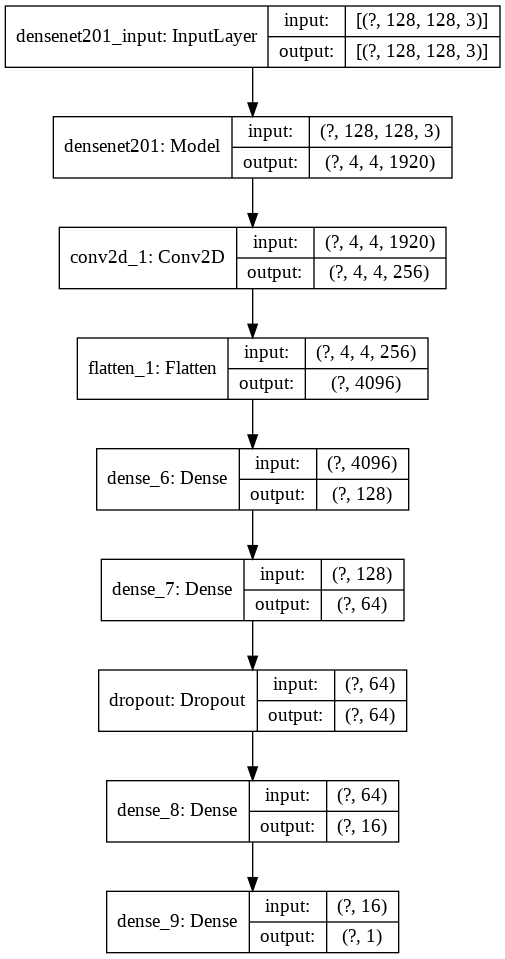

In [0]:
# rmsprop = RMSprop(lr=0.1)
# adam = tf.keras.optimizers.Adam(lr=0.01)
sgd = tf.keras.optimizers.SGD(learning_rate=0.001, momentum=0.9)
def loss_fn(y_true, y_pred):
  loss = tf.keras.losses.binary_crossentropy(y_true, y_pred, from_logits=True)
  return loss

model.compile(optimizer=sgd, loss=loss_fn,
              metrics=['accuracy'])

tf.keras.utils.plot_model(model, show_shapes=True)

## Train on batch

In [0]:
i = 0
batch_size = 64
batch_features = np.zeros(shape=(batch_size, 128, 128, 3))
batch_labels = np.zeros(shape=(batch_size))
for inputs_batch, labels_batch in training_generator:
    # features_batch = conv_base.predict(inputs_batch)
    batch_features[0 : batch_size] = inputs_batch
    batch_labels[0: batch_size] = labels_batch
    if np.count_nonzero(batch_labels) > 1:
      print('Found!')
      break

print(batch_features.shape, batch_labels.shape)


Found!
(64, 128, 128, 3) (64,)


In [0]:
pos = np.count_nonzero(batch_labels)
neg = batch_size - pos
total = batch_size
# Scaling by total/2 helps keep the loss to a similar magnitude.
# The sum of the weights of all examples stays the same.
weight_for_0 = (1 / neg)*(total)/2.0 
weight_for_1 = (1 / pos)*(total)/2.0

class_weight = {0: weight_for_0, 1: weight_for_1}

print('Weight for class 0: {:.2f}'.format(weight_for_0))
print('Weight for class 1: {:.2f}'.format(weight_for_1))

Weight for class 0: 1.00
Weight for class 1: 1.00


In [0]:
epochs = 10
for i in range(epochs):
  metrics = model.train_on_batch(
                  batch_features,
                  y=batch_labels
                  # class_weight=class_weight
              )
  print(i, ' epoch: ', metrics[0], metrics[1])



0  epoch:  0.5261545 1.0
1  epoch:  0.5211799 1.0
2  epoch:  0.5184251 1.0
3  epoch:  0.5166116 1.0
4  epoch:  0.5150602 1.0
5  epoch:  0.5136795 1.0
6  epoch:  0.51245 1.0
7  epoch:  0.5113592 1.0
8  epoch:  0.5104091 1.0
9  epoch:  0.5095749 1.0


In [0]:
for prediction, answer in zip(model.predict(x=batch_features), batch_labels):
  print(prediction, answer)


## Train all dataset

In [0]:
from google.colab import drive
import os
import json

drive.mount('/content/drive')
PATH_model = '/content/drive/My Drive/DL/his_new2/'

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3aietf%3awg%3aoauth%3a2.0%3aoob&response_type=code&scope=email%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdocs.test%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive.photos.readonly%20https%3a%2f%2fwww.googleapis.com%2fauth%2fpeopleapi.readonly

Enter your authorization code:
··········
Mounted at /content/drive


In [0]:
model.load_weights(PATH_model+'model_tumor1.h5')

In [0]:
import datetime 
import os
date = datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
log_dir = os.path.join("/content/drive/My Drive/DL/tensorboard-logs/", date)
print("Writing logs to", log_dir)

Writing logs to /content/drive/My Drive/DL/tensorboard-logs/20191219-225043


In [0]:
# import warnings
# warnings.filterwarnings('ignore')

exp_dir = os.path.join(log_dir, "exp2")
callbacks = [
    tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=50, verbose=1),
    # tf.keras.callbacks.TensorBoard(log_dir=exp_dir),
    tf.keras.callbacks.ReduceLROnPlateau(factor=0.1, patience=5, min_lr=0.00000001, verbose=1),
    tf.keras.callbacks.ModelCheckpoint(PATH_model+'model_tumor.h5', verbose=1, save_best_only=True, save_weights_only=True)
]

In [0]:
EPOCHS = 600

# Train model on dataset

model_history = model.fit_generator(generator=training_generator,
                    validation_data=validation_generator,
                    use_multiprocessing=False,
                    workers=1, 
                    epochs=EPOCHS,
                    max_queue_size=6,
                    callbacks=callbacks)


  ...
    to  
  ['...']
  ...
    to  
  ['...']
Train for 312 steps, validate for 312 steps
Epoch 1/600
311/312 [============================>.] - ETA: 0s - loss: 0.5343 - accuracy: 0.9383
Epoch 00001: val_loss did not improve from 0.52293
312/312 [==============================] - 81s 260ms/step - loss: 0.5342 - accuracy: 0.9384 - val_loss: 0.5252 - val_accuracy: 0.9491
Epoch 2/600
311/312 [============================>.] - ETA: 0s - loss: 0.5171 - accuracy: 0.9708
Epoch 00002: val_loss did not improve from 0.52293
312/312 [==============================] - 63s 202ms/step - loss: 0.5171 - accuracy: 0.9708 - val_loss: 0.5257 - val_accuracy: 0.9425
Epoch 3/600
311/312 [============================>.] - ETA: 0s - loss: 0.5166 - accuracy: 0.9698
Epoch 00003: val_loss improved from 0.52293 to 0.52286, saving model to /content/drive/My Drive/DL/his_new2/model_tumor.h5
312/312 [==============================] - 65s 209ms/step - loss: 0.5166 - accuracy: 0.9699 - val_loss: 0.5229 - val_accur

### Use the model to make predictions on a validation batch
Compare the predicted answer to the label. Verify they match.

In [0]:
i = 0
batch_size = 32
batch_features = np.zeros(shape=(batch_size, 128, 128, 3))
batch_labels = np.zeros(shape=(batch_size))
for inputs_batch, labels_batch in validation_generator:
    # features_batch = conv_base.predict(inputs_batch)
    batch_features[0 : batch_size] = inputs_batch
    batch_labels[0: batch_size] = labels_batch
    if np.count_nonzero(batch_labels) > 1:
      print('Found!')
      break

print(batch_features.shape, batch_labels.shape)

Found!
(32, 128, 128, 3) (32,)


In [0]:
for prediction, answer in zip(model.predict(x=batch_features), batch_labels):
  print(prediction, answer)

[0.] 0.0
[1.] 1.0
[0.] 0.0
[0.] 0.0
[1.] 1.0
[2.9802322e-08] 0.0
[1.] 1.0
[1.] 1.0
[0.] 0.0
[1.] 1.0
[1.] 1.0
[1.] 1.0
[1.] 1.0
[0.] 0.0
[0.] 0.0
[0.] 0.0
[0.] 0.0
[0.99999994] 1.0
[1.] 1.0
[5.197525e-05] 0.0
[1.] 1.0
[0.] 0.0
[0.] 0.0
[1.] 1.0
[0.] 0.0
[0.] 0.0
[1.] 1.0
[1.] 1.0
[1.] 1.0
[0.] 0.0
[0.] 0.0
[1.] 1.0


In [0]:
loss = []
val_loss =[]

acc = []
val_acc = []

In [0]:
loss.extend(model_history.history['loss'][:-1])
val_loss.extend(model_history.history['val_loss'][:-1])
acc.extend(model_history.history['accuracy'])
val_acc.extend(model_history.history['val_accuracy'])

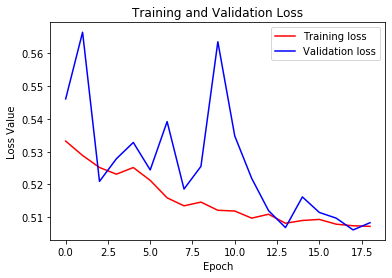

In [0]:
epochs = range(len(loss))

plt.figure()
plt.plot(epochs, loss, 'r', label='Training loss')
plt.plot(epochs, val_loss, 'b', label='Validation loss')
plt.title('Training and Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss Value')
# plt.ylim([0, 1])
plt.legend()
plt.show()

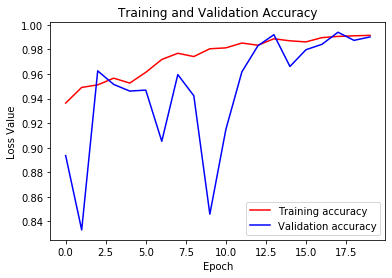

In [0]:
epochs = range(len(acc))
plt.figure()
plt.plot(epochs, acc, 'r', label='Training accuracy')
plt.plot(epochs, val_acc, 'b', label='Validation accuracy')
plt.title('Training and Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Loss Value')
# plt.ylim([0, 1])
plt.legend()
plt.show()

In [0]:
np.save(PATH+'his_several/loss.npy', loss)
np.save(PATH+'his_several/val_loss.npy', val_loss)

np.save(PATH+'his_several/acc.npy', acc)
np.save(PATH+'his_several/val_acc.npy', val_acc)

model.save(PATH+'his_several/my_model.h5') 

## Prediction visualization

In [0]:
def load_and_preprocess_image(path_img, path_label):
  # input_image = tf.io.read_file(path_img)
  # print("path_img: ", path_img)
  # print("path_label: ", path_label)
  img_tensor = tf.io.read_file(path_img)
  input_image = tf.image.decode_jpeg(img_tensor, channels=3)
  # print(input_image.shape)
  input_image = tf.image.resize(input_image, [IMG_SIZE, IMG_SIZE])
  # print('ok1')
  label_tensor = tf.io.read_file(path_label)

  # input_mask = tf.image.decode_image(label_tensor)
  input_mask = tf.image.decode_jpeg(label_tensor, channels=1)
  input_mask = tf.image.resize(input_mask, [IMG_SIZE, IMG_SIZE])
  
  input_image /= 255.0
  input_mask /= 255.0
  return input_image, input_mask

In [0]:
IMG_SIZE = 128
def load_and_preprocess_image_test(path_img, path_label):
  img_tensor = tf.io.read_file(path_img)
  input_image = tf.image.decode_jpeg(img_tensor, channels=3)
  input_image = tf.image.resize(input_image, [IMG_SIZE, IMG_SIZE])

  label_tensor = tf.io.read_file(path_label)
  # input_mask = tf.image.decode_image(label_tensor)
  input_mask = tf.image.decode_jpeg(label_tensor, channels=1)
  input_mask = tf.image.resize(input_mask, [IMG_SIZE, IMG_SIZE])
  
  input_image /= 255.0
  # input_mask /= 255.0
  return input_image, input_mask

### True mask 001

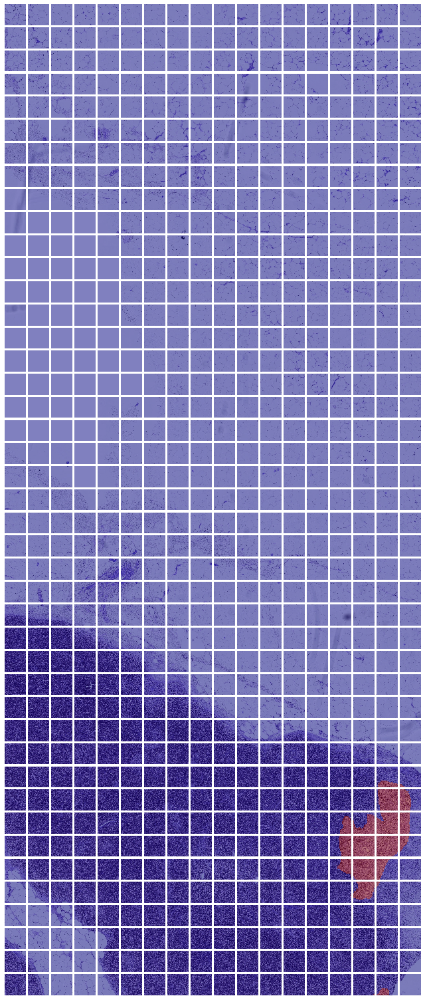

In [0]:
mm = 43
nn = 18
import cv2
WIDTH = 128
HEIGHT = 128

fig, axes = plt.subplots(mm, nn, figsize=(18//2,43//2))
idd = []

for i in range(mm):
  for j in range(nn):
    try:
      img_path = "dt/001_" + str(43*2+i) + "_" + str(18*3+j) + ".jpg"
      label_path = "dt/001_" + str(43*2+i) + "_" + str(18*3+j) + "_mask.jpg"
      slide_image, mask_img = load_and_preprocess_image_test(img_path, label_path)
    except:
      slide_image, mask_img = np.ones((128,128,3)), np.zeros((128,128,1))

    # img_path = "dt/001_" + str(i) + "_" + str(j) + ".jpg"
    # label_path = "dt/001_" + str(i) + "_" + str(j) + "_mask.jpg"
    # slide_image, mask_img = load_and_preprocess_image_test(img_path, label_path)
    # print(slide_image.shape)
    # mask_img = mask_img * 255.0

    mask_img = mask_img[...,0]
    # print(slide_image.shape)
    axes[i][j].imshow(slide_image)
    # axes[j][i].axis('off')
    axes[i][j].imshow(mask_img, vmin=0.0, vmax=1.0, cmap='jet', alpha=0.5)
    axes[i][j].axis('off')

    # mask_img = mask_img * 255.0
    # cv2.imwrite("dt/" + "091_%d_%d.jpg" % (i, j), slide_image)
    # cv2.imwrite("dt/" + "091_%d_%d_mask.jpg" % (i, j), mask_img)

    idd.append(str(i) + '_' + str(j))

plt.tight_layout()
plt.subplots_adjust(wspace = 0.1, hspace = 0.1)
plt.show()

### Predicted mask 001

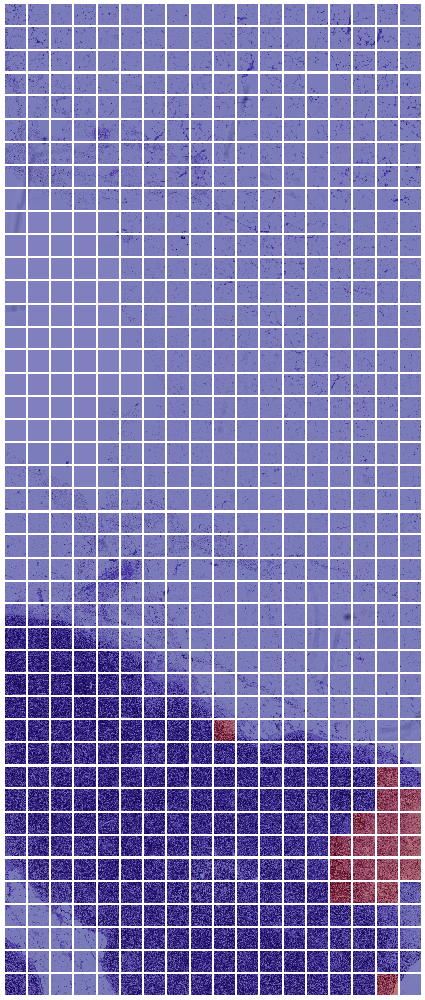

In [0]:
mm = 43
nn = 18
import cv2
WIDTH = 128
HEIGHT = 128

fig, axes = plt.subplots(mm, nn, figsize=(18//2,43//2))
idd = []

for i in range(mm):
  for j in range(nn):
    try:
      img_path = "dataset/dt001/001_" + str(43*2+i) + "_" + str(18*3+j) + ".jpg"
      label_path = "dataset/dt001/001_" + str(43*2+i) + "_" + str(18*3+j) + "_mask.jpg"
      slide_image, mask_img = load_and_preprocess_image_test(img_path, label_path)
    except:
      slide_image, mask_img = np.ones((128,128,3)), np.zeros((128,128,1))
    # print(slide_image.shape)
    # mask_img = mask_img * 255.0

    image = tf.expand_dims(slide_image, 0)
    # print(image.shape)
    pred_mask = model.predict(image)
    # print(pred_mask)
    if pred_mask[0][0] >0.5:
      mask_img = np.ones((128,128,1))
    else:
      mask_img = np.zeros((128,128,1))
    mask_img = mask_img[...,0]

    # mask_img = pred_mask
    # print(slide_image.shape)
    axes[i][j].imshow(slide_image)
    # axes[j][i].axis('off')
    axes[i][j].imshow(mask_img, vmin=0, vmax=1, cmap='jet', alpha=0.5)
    axes[i][j].axis('off')

    mask_img = mask_img * 255.0
    # cv2.imwrite("dt/" + "091_%d_%d.jpg" % (i, j), slide_image)
    # cv2.imwrite("dt/" + "091_%d_%d_mask.jpg" % (i, j), mask_img)

    idd.append(str(i) + '_' + str(j))

plt.tight_layout()
plt.subplots_adjust(wspace = 0.1, hspace = 0.1)
plt.show()

### True mask 091

In [0]:
!unzip dt091.zip

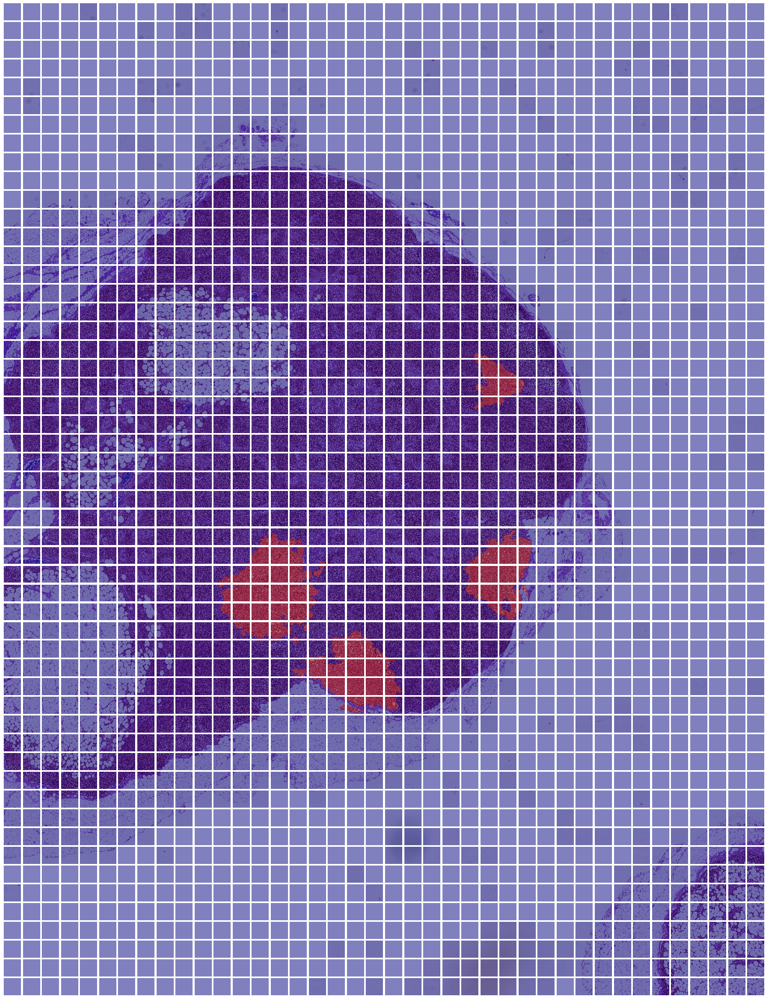

In [0]:
mm = 53
nn = 40
import cv2
WIDTH = 128
HEIGHT = 128

fig, axes = plt.subplots(mm, nn, figsize=(40//2,53//2))
idd = []

for i in range(mm):
  for j in range(nn):
    try:
      img_path = "091_" + str(i) + "_" + str(20+j) + ".jpg"
      label_path = "091_" + str(i) + "_" + str(20+j) + "_mask.jpg"
      slide_image, mask_img = load_and_preprocess_image_test(img_path, label_path)
    except:
      slide_image, mask_img = np.ones((128,128,3)), np.zeros((128,128,1))

    # img_path = "dt/001_" + str(i) + "_" + str(j) + ".jpg"
    # label_path = "dt/001_" + str(i) + "_" + str(j) + "_mask.jpg"
    # slide_image, mask_img = load_and_preprocess_image_test(img_path, label_path)
    # print(slide_image.shape)
    # mask_img = mask_img * 255.0

    mask_img = mask_img[...,0]
    # print(slide_image.shape)
    axes[i][j].imshow(slide_image)
    # axes[j][i].axis('off')
    axes[i][j].imshow(mask_img, vmin=0.0, vmax=1.0, cmap='jet', alpha=0.5)
    axes[i][j].axis('off')

    # mask_img = mask_img * 255.0
    # cv2.imwrite("dt/" + "091_%d_%d.jpg" % (i, j), slide_image)
    # cv2.imwrite("dt/" + "091_%d_%d_mask.jpg" % (i, j), mask_img)

    idd.append(str(i) + '_' + str(j))

plt.tight_layout()
plt.subplots_adjust(wspace = 0.1, hspace = 0.1)
plt.show()

### Predicted mask 091

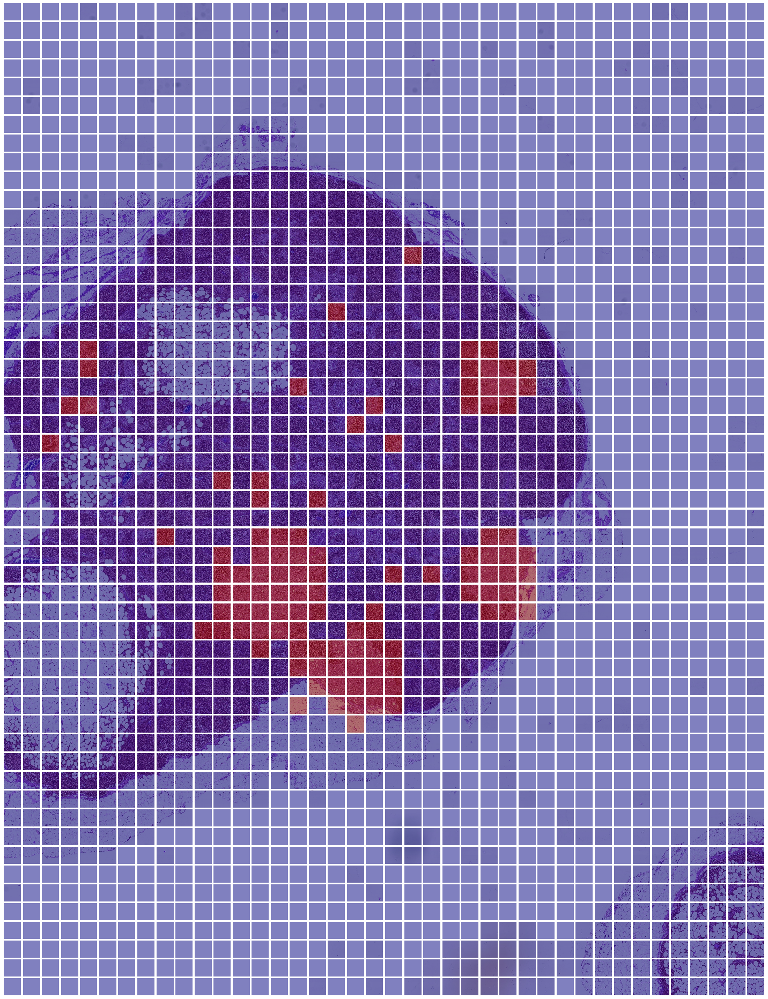

In [0]:
mm = 53
nn = 40
import cv2
WIDTH = 128
HEIGHT = 128

fig, axes = plt.subplots(mm, nn, figsize=(40//2,53//2))
idd = []

for i in range(mm):
  for j in range(nn):
    try:
      img_path = "091_" + str(i) + "_" + str(20+j) + ".jpg"
      label_path = "091_" + str(i) + "_" + str(20+j) + "_mask.jpg"
      slide_image, mask_img = load_and_preprocess_image_test(img_path, label_path)
    except:
      slide_image, mask_img = np.ones((128,128,3)), np.zeros((128,128,1))
    # print(slide_image.shape)
    # mask_img = mask_img * 255.0

    image = tf.expand_dims(slide_image, 0)
    # print(image.shape)
    pred_mask = model.predict(image)
    # print(pred_mask)
    if pred_mask[0][0] >0.5:
      mask_img = np.ones((128,128,1))
    else:
      mask_img = np.zeros((128,128,1))
    mask_img = mask_img[...,0]

    # mask_img = pred_mask
    # print(slide_image.shape)
    axes[i][j].imshow(slide_image)
    # axes[j][i].axis('off')
    axes[i][j].imshow(mask_img, vmin=0, vmax=1, cmap='jet', alpha=0.5)
    axes[i][j].axis('off')

    mask_img = mask_img * 255.0
    # cv2.imwrite("dt/" + "091_%d_%d.jpg" % (i, j), slide_image)
    # cv2.imwrite("dt/" + "091_%d_%d_mask.jpg" % (i, j), mask_img)

    idd.append(str(i) + '_' + str(j))

plt.tight_layout()
plt.subplots_adjust(wspace = 0.1, hspace = 0.1)
plt.show()